In [1]:
from operator import index
from re import A
import pandas as pd
import os
from sklearn import cluster

from sklearn.neighbors import DistanceMetric
dir_path = os.path.abspath('')
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import math
from scipy import stats
import sklearn
import click
from sklearn.preprocessing import Normalizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
import mlflow
from sklearn_extra.cluster import KMedoids
from tslearn.clustering import KShape
from tslearn.clustering import silhouette_score as dtw_silhouette_score
from numpy import reshape as reshape
from sklearn.cluster import AgglomerativeClustering
from dtaidistance import dtw
import random
from tslearn.utils import to_time_series_dataset
from tslearn.clustering import TimeSeriesKMeans

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

/Users/angelospipergias/Coding Projects/ASM_Clustering2.0/.venv/lib/python3.9/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [2]:
#code to format titles for the graphs to contain info on consumption, generation, use
def id_title(id, description):
    title = id + "(C,"
    if(not np.isnan(description.loc[id]['Production (kW)']) and description.loc[id]['Production (kW)']>0.0): title = title + "P,"
     
    title = title + str(description.loc[id]['Type'])

    return(title + ")")

In [3]:
meter_description = pd.read_csv(dir_path+'/smart_meter_description.csv', engine='python')
meter_description.index = meter_description.id
meters = meter_description.id.tolist()
meters

['BBB6004',
 'BBB6007',
 'BBB6017',
 'BBB6018',
 'BBB6020',
 'BBB6021',
 'BBB6022',
 'BBB6025',
 'BBB6028',
 'BBB6029',
 'BBB6030',
 'BBB6032',
 'BBB6036',
 'BBB6040',
 'BBB6048',
 'BBB6050',
 'BBB6051',
 'BBB6052',
 'BBB6055',
 'BBB6061',
 'BBB6062',
 'BBB6063',
 'BBB6064',
 'BBB6065',
 'BBB6067',
 'BBB6071',
 'BBB6074',
 'BBB6078',
 'BBB6086',
 'BBB6087',
 'BBB6097',
 'BBB6100',
 'BBB6103',
 'BBB6105',
 'BBB6133',
 'BBB6140',
 'BBB6168',
 'BBB6169',
 'BBB6170',
 'BBB6171',
 'BBB6173',
 'BBB6177',
 'BBB6178',
 'BBB6179',
 'BBB6180',
 'BBB6181',
 'BBB6182',
 'BBB6183',
 'BBB6186',
 'BBB6190',
 'BBB6191',
 'BBB6192',
 'BBB6197',
 'BBB6198']

In [4]:
meter_description = pd.read_csv(dir_path+'/smart_meter_description.csv', engine='python')
#meter_description.rename(columns={'id': 'ID'}, inplace=True)
meter_description.index = meter_description.id
meter_description.drop(columns={'id'}, inplace=True)
meter_description
#meter_description.to_csv(dir_path+'/test/smart_meter_description.csv')


,Contractual power (kW),Production (kW),Type
id,,,
BBB6004,40.0,10.8,NaN
BBB6007,NaN,NaN,pump
BBB6017,1.5,31.0,company
BBB6018,137.0,155.0,company
BBB6020,100.0,0.0,university
BBB6021,35.0,50.0,company
BBB6022,95.0,0.0,Pump
BBB6025,7.7,19.3,company
BBB6028,125.0,0.0,pool


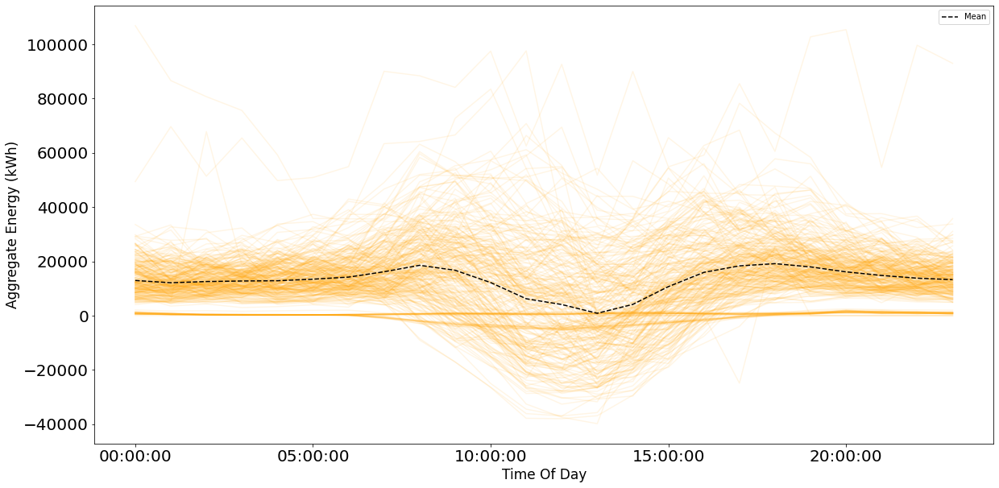

In [5]:
df2 = pd.read_csv('clean_sql.csv', index_col=0)
fig, ax= plt.subplots(1, figsize=(20,10))
df2.groupby('date').sum().T.plot(ax=ax,legend=False, alpha=0.1, color='orange', label= 'Daily Consumption', fontsize=20)
df2.groupby('date').sum().mean().T.plot(ax=ax,legend=True, color='black', ls='--', label= 'Mean')
plt.xlabel('Time Of Day', fontsize='17')
plt.ylabel('Aggregate Energy (kWh)', fontsize='17')
plt.savefig('/users/angelospipergias/Desktop/figuresForPaper/aggregate.png', dpi=300)

In [6]:
def scale(array):
    # Very important to scale!
    sc = Normalizer(norm='l2')
    array = sc.fit_transform(array)
    return array


def df_and_np_array():
    df1 = pd.read_csv('clean_mongo.csv', index_col=0)
    df2 = pd.read_csv('clean_sql.csv', index_col=0)
    df1 = df1[df1['id'] != 'BBB6179']
    df1 =df1[df1['id'] != 'BBB6169']

    all_data = pd.concat([df1,df2])
    all_data.dropna(axis=0, inplace=True)
    all_data = all_data.reset_index()

    X = all_data.copy()
    X = X.drop(columns=['id', 'date', 'index'])
    X = X.values.copy()
    return(all_data, X)

In [7]:
all_data, X = df_and_np_array()
X = scale(X)

In [8]:
all_data.date = pd.to_datetime(all_data.date)
all_data['month'] = all_data.date.dt.month
all_data['day'] = all_data.date.dt.day_of_week

In [9]:
#kmeans = KMeans(
#        n_clusters=14, init='random',
#        n_init=10, random_state=0
#    )

#cluster_found = kmeans.fit_predict(X)
#cluster_centers = kmeans.cluster_centers_

X1 = to_time_series_dataset(X)
kmeans = TimeSeriesKMeans(n_clusters=14, init='random', n_init=10, random_state=0, metric="dtw", max_iter=5, metric_params={"global_constraint": "sakoe_chiba", "sakoe_chiba_radius":1})
cluster_found = kmeans.fit_predict(X1)
cluster_centers = kmeans.cluster_centers_
cluster_centers = cluster_centers.reshape(cluster_centers.shape[0], (cluster_centers.shape[1]*cluster_centers.shape[2]))


In [10]:
def graphs(X, all_data, k, cluster_found, cluster_centers):
    scaled_data = pd.DataFrame(X, all_data.index, all_data.columns.tolist().remove('id'))
    scaled_data 
    scaled_data['cluster'] = pd.Series(cluster_found, name='cluster')
    scaled_data['month'] = all_data.month

    #plot the cluster centers and the samples that belong to each cluster:
    fig, ax= plt.subplots(4, 4, figsize=(15,15))
    clusters = {}
    i = 0 
    j = 0
    for cluster in range(0,k):
        clusters[cluster] = scaled_data[scaled_data['cluster'] == cluster].drop(columns=['cluster', 'month'])
        clusters[cluster].T.plot(ax=ax[i][j], legend=False, alpha=0.01, color='orange', label= f'Cluster {cluster}')

        cluster_centers = pd.DataFrame(cluster_centers)
        cluster_centers.iloc[[cluster]].T.plot(legend=True, color='black', ls='--', ax=ax[i][j])

        ax[i][j].set_title("Cluster " + str(cluster), fontsize=17)
        ax[i][j].set_xlabel("Time", fontsize=17)
        ax[i][j].set_ylabel("Normalized Energy", fontsize=17)
        ax[i][j].tick_params(axis='both', which='major', labelsize=12)
        ax[i][j].tick_params(axis='both', which='major', labelsize=12)
        j = j+1
        if(j==4):
            j = 0
            i = i + 1
    fig.tight_layout()
    fig.savefig("results/k14clusterCenters.png", dpi=80)
    fig.savefig("results/k14clusterCentersHighRes.png", dpi=300)
    fig.savefig("/users/angelospipergias/Desktop/figuresForPaper/Picture6.png", dpi=300)
    
    #clear figure:
    fig.clf()

    colors = sns.color_palette('pastel')[0:k]
    pie = scaled_data.groupby('cluster').size().plot(kind='pie', autopct='%.0f%%', textprops={'fontsize': 35},
                                  colors=colors)
    fig = pie.get_figure()
    fig.savefig("results/clusterPie.png", dpi=100)
    fig.savefig("/users/angelospipergias/Desktop/figuresForPaper/Picture7.png", dpi=300)

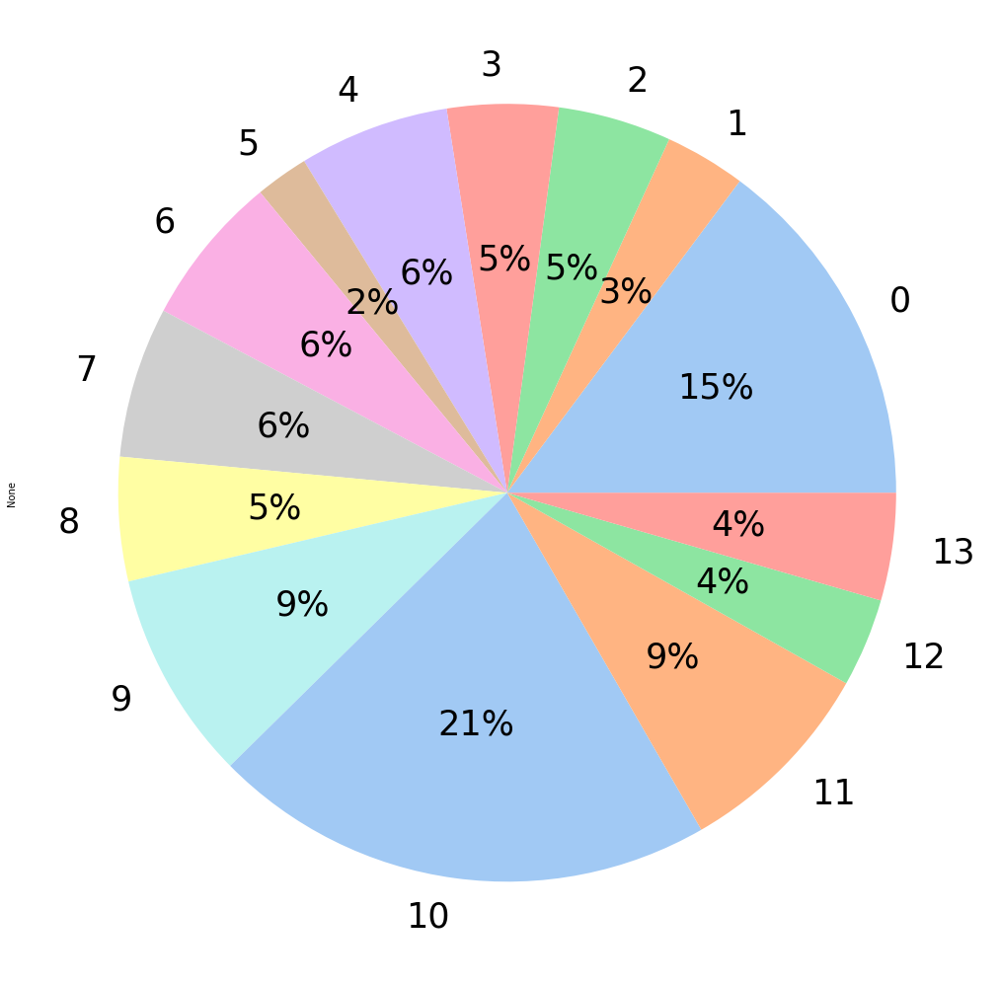

In [11]:
graphs(X, all_data, 14, cluster_found, cluster_centers)
    

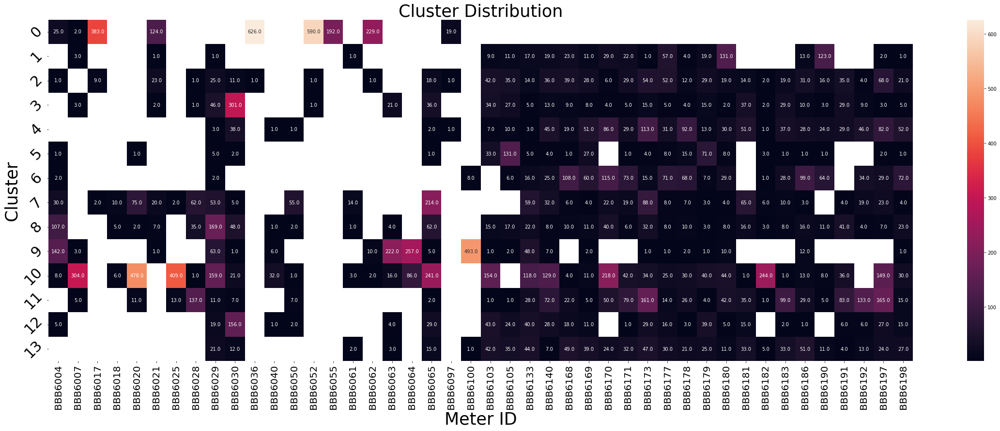

In [12]:
scaled_data = pd.DataFrame(X, all_data.index, all_data.columns.tolist().remove('id'))
scaled_data['id'] = all_data['id'] 
scaled_data['cluster'] = pd.Series(cluster_found, name='cluster')
cluster_distribution = scaled_data[0].groupby([scaled_data.cluster, scaled_data.id]).agg('count').unstack()

figure, ax = plt.subplots(1, 1, figsize=(40,13))
ax.set_title("Cluster Distribution", fontsize=35)
ax = sns.heatmap(cluster_distribution, annot=True, fmt='.1f')
plt.yticks(rotation=45, fontsize=30)
plt.ylabel('Cluster', fontsize=35)
plt.xticks(fontsize=20)
plt.xlabel('Meter ID', fontsize=35)
plt.show()
plt.show()

figure.savefig('/users/angelospipergias/Desktop/figuresForPaper/Picture8.png', dpi=300)
#scaled_data

Calculating Entropies for each customer:

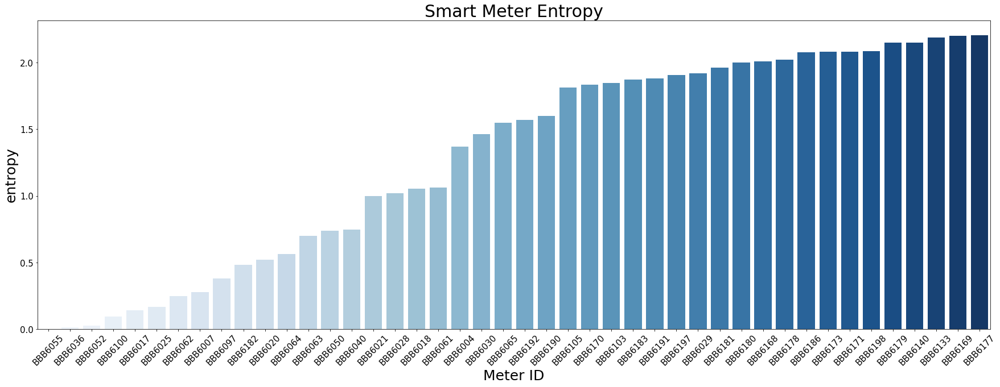

In [13]:
def calc(series):
    sum = 0
    for index, value in series.items():
        sum = sum - (value*math.log(value))
    return(sum)

def entropy(all_data, id):
    for_entropy = all_data.groupby(['id', 'cluster']).size()
    sum = for_entropy.loc[id].sum()
    relative_frequencies = for_entropy.loc[id]/sum
    return(relative_frequencies.agg(calc))

all_data['cluster'] = pd.Series(cluster_found, name='cluster')
entropies = []
IDs = pd.unique(all_data['id'])
for id in IDs:
    entropies.append(entropy(all_data, id))

#entropies = pd.Series(index=IDs, data = entropies)
entropies = pd.DataFrame(data = list(zip(IDs, entropies)), columns=['id', 'entropy'])


figure, ax = plt.subplots(1, 1, figsize=(30,10))
ax.set_title("Smart Meter Entropy", fontsize=30)
#print(entropies.index)
ax = sns.barplot(x='id', y='entropy', data=entropies.sort_values(by='entropy', ascending=True), palette='Blues')
plt.xticks(rotation=45, fontsize=17)
plt.ylabel('entropy', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Meter ID', fontsize=25)
plt.show()
figure.savefig("results/entropy.png", dpi=300)
figure.savefig("/users/angelospipergias/Desktop/figuresForPaper/Picture23.png", dpi=300)






Case 1: each customer belongs to many different clusters

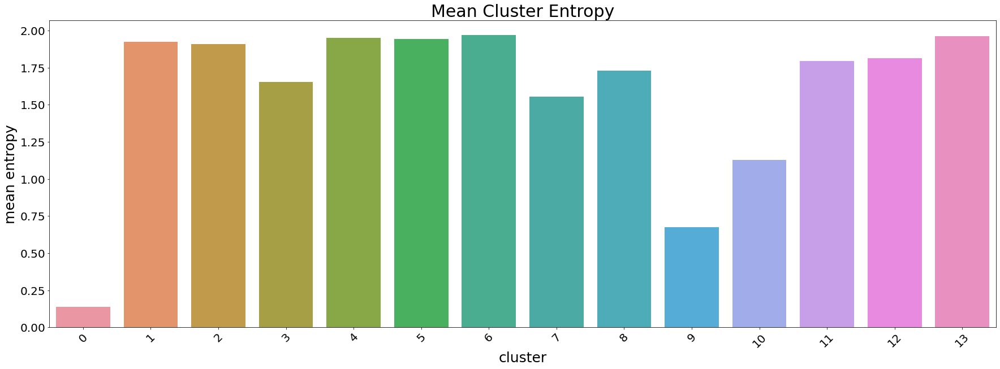

In [14]:
scaled_data = pd.DataFrame(X, all_data.index, all_data.columns.tolist().remove('id'))

scaled_data['cluster'] = pd.Series(cluster_found, name='cluster')
scaled_data['month'] = all_data.month
cluster_sizes = scaled_data.groupby('cluster').size()

entropies.index = entropies.id
entropies.drop(columns='id', inplace=True)

cluster_entropies = cluster_distribution.copy()
meters = cluster_distribution.columns
for i in meters:
    c = entropies.loc[i]
    cluster_entropies[i] = cluster_entropies[i].apply(lambda x: x*c)
cluster_entropies = cluster_entropies.sum(axis=1)
cluster_entropies = cluster_entropies / cluster_sizes

figure, ax = plt.subplots(1, 1, figsize=(30,10))
ax.set_title("Mean Cluster Entropy", fontsize=30)
ax = sns.barplot(x=cluster_entropies.index, y=cluster_entropies.values)
plt.xticks(rotation=45, fontsize=17)
plt.ylabel('mean entropy', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('cluster', fontsize=25)
plt.show()

figure.savefig("results/mean_cluster_entropy.png", dpi=300)
figure.savefig("/users/angelospipergias/Desktop/figuresForPaper/Picture24", dpi=300)



Case 2: each customer belongs to only one cluster.

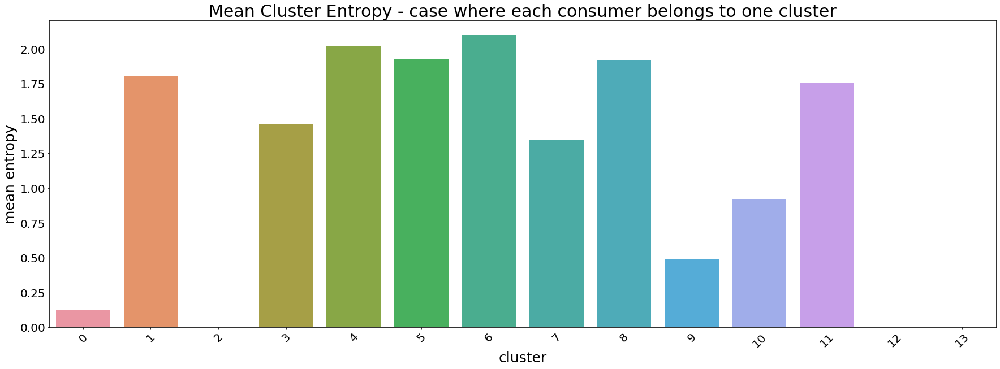

In [ ]:
absolute_cluster_distribution = cluster_distribution.where(cluster_distribution.eq(cluster_distribution.max(0),axis=1))
absolute_cluster_sizes = absolute_cluster_distribution.sum(axis=1)

entropies.index = entropies.id
entropies.drop(columns='id', inplace=True)

cluster_entropies = absolute_cluster_distribution.copy()
meters = cluster_distribution.columns
for i in meters:
    c = entropies.loc[i]
    cluster_entropies[i] = cluster_entropies[i].apply(lambda x: x*c)
cluster_entropies = cluster_entropies.sum(axis=1)
cluster_entropies = cluster_entropies / absolute_cluster_sizes

figure, ax = plt.subplots(1, 1, figsize=(30,10))
ax.set_title("Mean Cluster Entropy - case where each consumer belongs to one cluster", fontsize=30)
ax = sns.barplot(x=cluster_entropies.index, y=cluster_entropies.values)
plt.xticks(rotation=45, fontsize=17)
plt.ylabel('mean entropy', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('cluster', fontsize=25)
plt.show()

figure.savefig("/users/angelospipergias/Desktop/figuresForPaper/Picture26.png", dpi=300)
figure.savefig("results/mean_cluster_entropy_2.png", dpi=300)

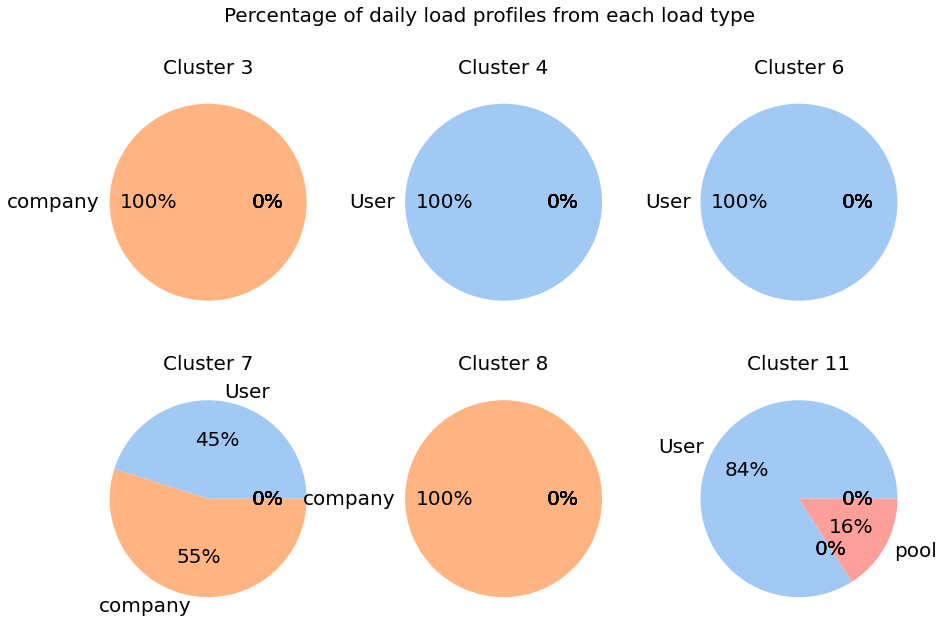

In [ ]:
fig, ax= plt.subplots(2, 3, figsize=(15,10))
fig.suptitle('Percentage of daily load profiles from each load type', fontsize=20)

colors = sns.color_palette('pastel')[0:4]
k=0
j=0
for i in [3,4,6,7,8,11]:
    pd.merge(absolute_cluster_distribution.loc[i], meter_description, how='inner', on='id').groupby('Type').sum()[i].plot(fontsize=20, ax=ax[j][k], title='cluster '+str(i), kind='pie', autopct='%.0f%%', textprops={'fontsize': 18}, colors=colors, label=' ')
    ax[j][k].set_title('Cluster ' +str(i), fontsize=20)
    if(k==2):
        k = 0
        j = j+1
    else:
        k=k+1

fig.savefig("results/loadtypes_2.png", dpi=300)
fig.savefig("/users/angelospipergias/Desktop/figuresForPaper/Picture25.png", dpi=300)

In [15]:
def graphs_per_cluster(X, all_data, k, cluster_found, cluster_centers):
    scaled_data = pd.DataFrame(X, all_data.index, all_data.columns.tolist().remove('id'))
    scaled_data 
    scaled_data['cluster'] = pd.Series(cluster_found, name='cluster')
    scaled_data['month'] = all_data.month
    scaled_data['id'] = all_data.id
    cluster_centers = pd.DataFrame(cluster_centers)
    colors = sns.color_palette('pastel')[0:k]
    #scaled_data['day'] = all_data['day']

    for i in range(0,14):
        fig, ax= plt.subplots(1, 2, figsize=(15,5))
        
        #winter vs summer:
        scaled_data[scaled_data['cluster'] == i].drop(columns=['cluster', 'month', 'id']).T.plot(ax=ax[0], legend=False, alpha=0.01, color='gold')
        scaled_data[scaled_data['cluster'] == i].drop(columns=['cluster', 'month', 'id']).mean().plot(ax=ax[0], legend=True, color='blue', ls='--', label= 'Mean')
        scaled_data[scaled_data['cluster'] == i].drop(columns=['cluster', 'month', 'id']).median().plot(ax=ax[0], legend=True, color='red', ls='--', label= 'Median')

        cluster_centers.iloc[[i]].T.plot(legend=True, color='black', ls='--', label='Center', ax=ax[0])
        ax[0].set_title("Cluster " + str(i), fontsize=18)
        ax[0].set_xlabel("Time(h)", fontsize=14)
        ax[0].set_ylabel("Normalized Energy(kWh)", fontsize=14)

        #pie chart of cluster membership percentages: 
        df = pd.merge(scaled_data, meter_description, how='inner', on='id')
        df[df['cluster']==i].groupby('Type').size().sort_values(ascending=False).plot(ax=ax[1],kind='pie', autopct='%.0f%%', textprops={'fontsize': 12},
                                  colors=colors)
        ax[1].set_title("Load Type Distribution", fontsize=18)
        ax[1].set_ylabel("")

        fig.savefig("results/cluster" + str(i) +'.png', dpi=300)

    
        
    

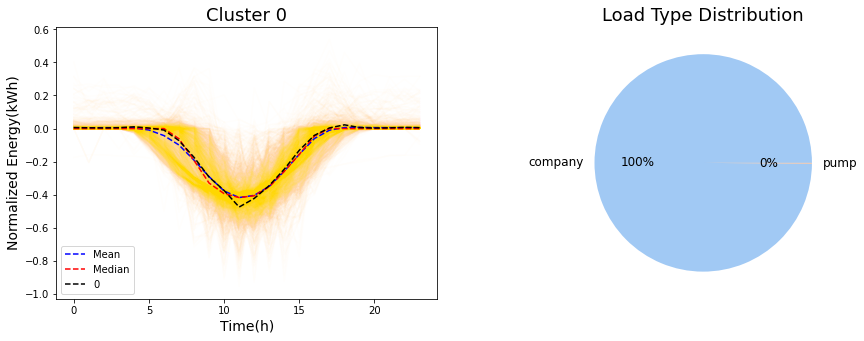

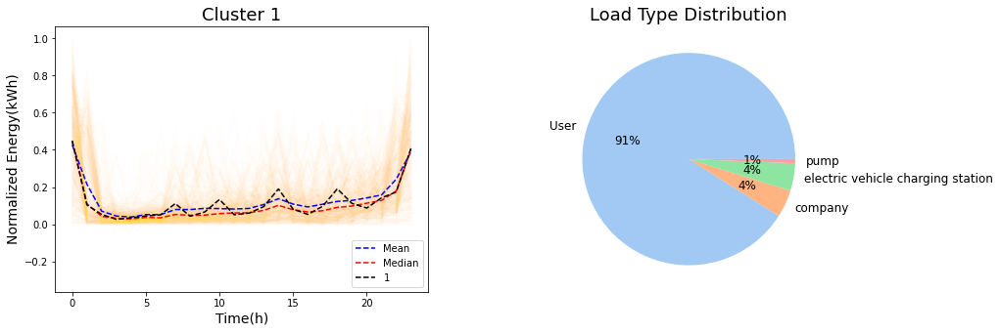

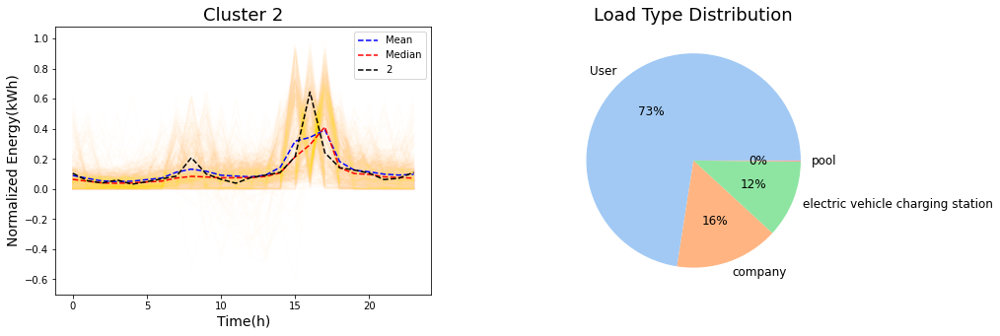

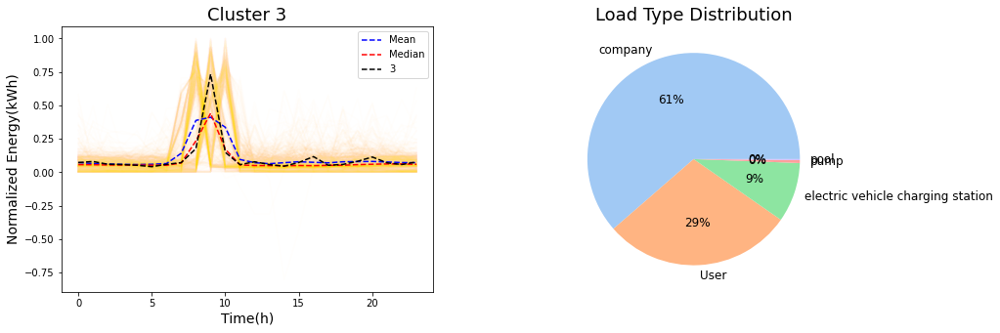

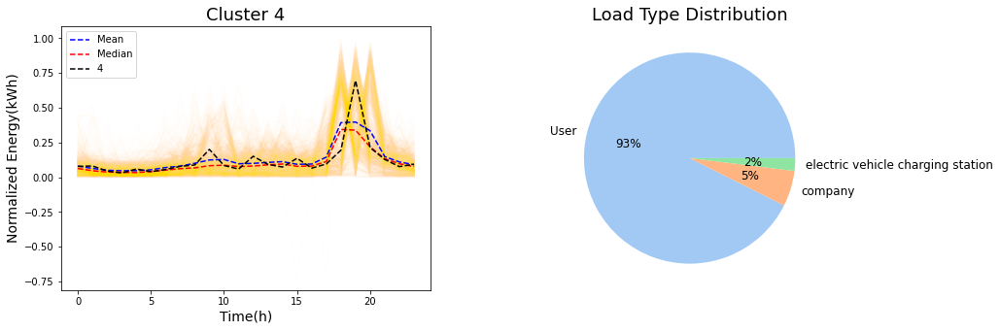

...

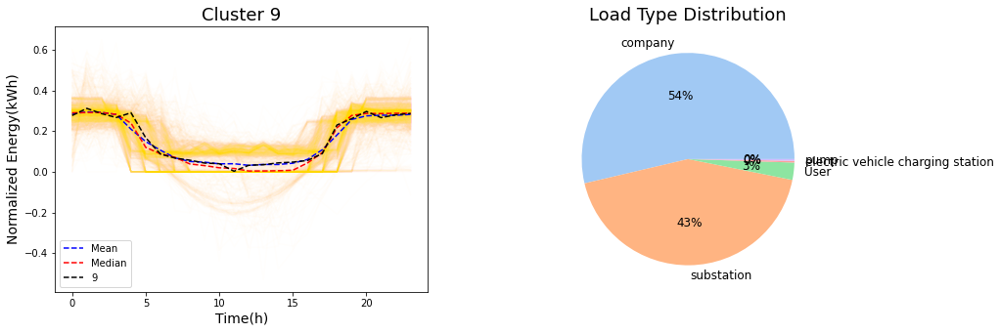

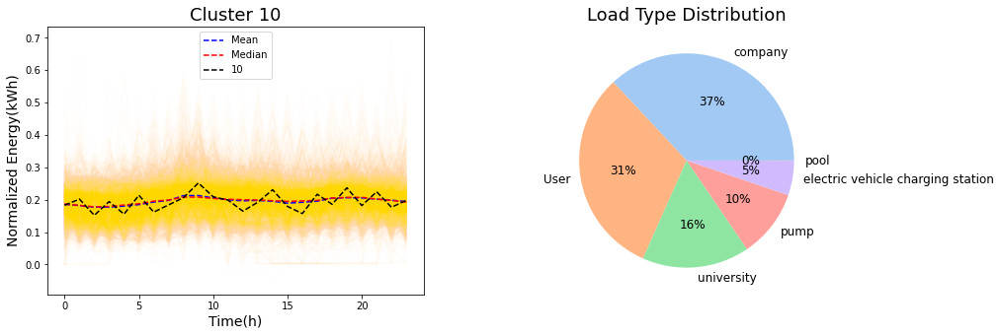

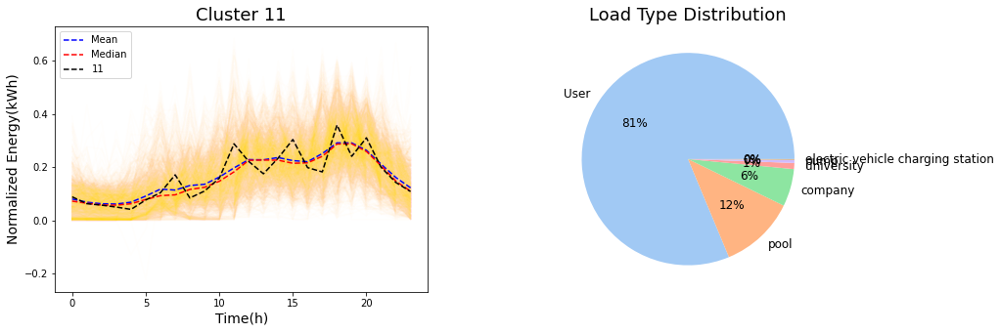

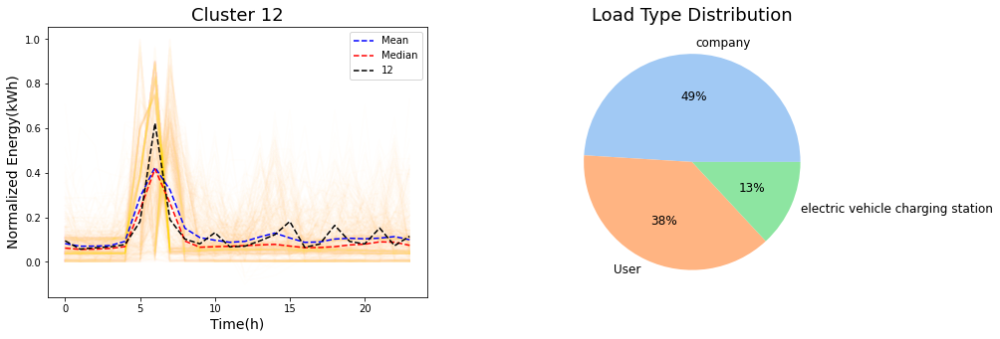

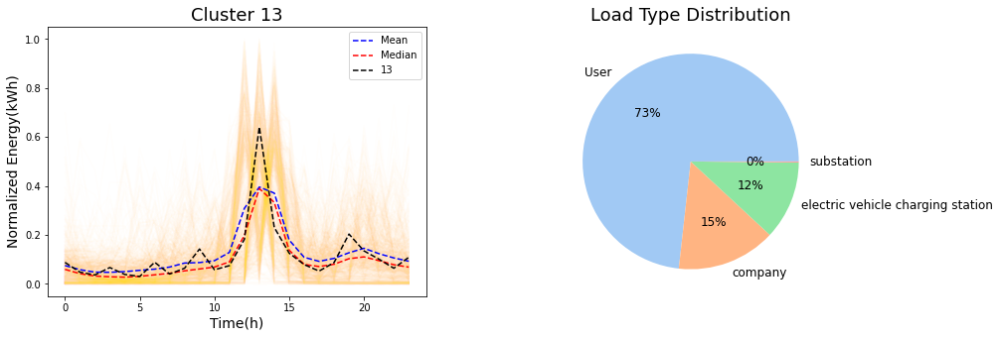

In [16]:
graphs_per_cluster(X, all_data, 14, cluster_found, cluster_centers)

In [17]:
def graphs_per_meter(X, all_data, k, cluster_found, cluster_centers):
    all_data['cluster'] = pd.Series(cluster_found, name='cluster')
    IDs = pd.unique(all_data['id'])

    colors = sns.color_palette('pastel')[0:k]
    bold_colors = ['blue', 'darkorange', 'green']

    for id in IDs: 
        fig, ax = plt.subplots(3, 3, figsize=(15,15))
        fig.suptitle(id_title(id, meter_description))

        #pie chart of cluster membership percentages: 
        all_data[all_data['id']==id].groupby('cluster').size().sort_values(ascending=False).plot(ax=ax[0][1],kind='pie', autopct='%.0f%%', textprops={'fontsize': 8},
                                  colors=colors)
        ax[0][1].set_title("Load Profile Distribution to Clusters")
        
        #visualizing the three most common clusters for this smart meter:
        most_common_clusters = all_data[all_data['id']==id].groupby('cluster').size().nlargest(3).index.tolist()
        i = 0
        for c in most_common_clusters:
            all_data[all_data['id']==id][all_data['cluster']==c].drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).T.plot(ax=ax[0][0], legend=False, alpha=0.2, color=colors[i])
            i = i+1
        i = 0
        for c in most_common_clusters:
            all_data[all_data['id']==id][all_data['cluster']==c].drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(ax=ax[0][0], legend=True, linewidth=3  ,ls='--', color=bold_colors[i], label=str(str(i+1) +': Cluster '+str(c)))
            i = i+1
        ax[0][0].set_title("Three Top Clusters")
        ax[0][0].set_xlabel("Time (h)")
        ax[0][0].set_ylabel("Energy (kWh)")

        #entropy stripplot
        entropies = []
        IDs = pd.unique(all_data['id'])
        for this_id in IDs:
            entropies.append(entropy(all_data, this_id))
        #entropies = pd.Series(index=IDs, data = entropies)
        entropies = pd.DataFrame(data = list(zip(IDs, entropies)), columns=['id', 'entropy'])
        sns.stripplot(ax=ax[0][2],x=entropies['entropy'], dodge=False)
        ax[0][2].set_title("Entropy Compared to Other Meters")

        #winter vs summer
        summer_data = all_data[all_data['id']==id][all_data['month'].isin([4,5,6,7,8,9])]
        winter_data = all_data[all_data['id']==id][all_data['month'].isin([10,11,12,1,2,3])]
        if(not summer_data.empty): summer_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).T.plot(ax=ax[1][0], legend=False, alpha=0.2, color=colors[1])
        if(not winter_data.empty): winter_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).T.plot(ax=ax[1][0], legend=False, alpha=0.2, color=colors[0])
        if(not summer_data.empty): summer_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(ax=ax[1][0], legend=True, ls='--', color="darkorange", linewidth=3, label='Summer Mean')
        if(not winter_data.empty): winter_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(ax=ax[1][0], legend=True, ls='--', linewidth=3, color="blue", label='Winter Mean')
        ax[1][0].set_title("Winter vs Summer")
        
        winter_colors = sns.color_palette('Blues')[0:k]
        if(not winter_data.empty): all_data[all_data['id']==id][all_data['month'].isin([10,11,12,1,2,3])].groupby('cluster').size().sort_values(ascending=False).plot(ax=ax[1][1],kind='pie', autopct='%.0f%%', textprops={'fontsize': 8},
                                  colors=winter_colors)
        ax[1][1].set_title("Winter Profile Distribution to Clusters")

        summer_colors = sns.color_palette('Oranges')[0:k]
        if(not summer_data.empty): all_data[all_data['id']==id][all_data['month'].isin([4,5,6,7,8,9])].groupby('cluster').size().sort_values(ascending=False).plot(ax=ax[1][2],kind='pie', autopct='%.0f%%', textprops={'fontsize': 8},
                                  colors=summer_colors)
        ax[1][2].set_title("Summer Profile Distribution to Clusters")

        #weekdays vs weekend
        weekday_data = all_data[all_data['id']==id][all_data['day'].isin([0,1,2,3,4])]
        weekend_data = all_data[all_data['id']==id][all_data['day'].isin([5,6])]
        if(not weekday_data.empty): weekday_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).T.plot(ax=ax[2][0], legend=False, alpha=0.2, color='gray')
        if(not weekend_data.empty): weekend_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).T.plot(ax=ax[2][0], legend=False, alpha=0.2, color='palegreen')
        if(not weekday_data.empty): weekday_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(ax=ax[2][0], legend=True, ls='--', color="black", linewidth=3, label='Weekday Mean')
        if(not weekend_data.empty): weekend_data.drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(ax=ax[2][0], legend=True, ls='--', linewidth=3, color="green", label='Weekend Mean')
        ax[2][0].set_title("Weekdays vs Weekend")
        
        weekday_colors = sns.color_palette('Greys')[0:k]
        if(not weekday_data.empty): all_data[all_data['id']==id][all_data['day'].isin([0,1,2,3,4])].groupby('cluster').size().sort_values(ascending=False).plot(ax=ax[2][1],kind='pie', autopct='%.0f%%', textprops={'fontsize': 8},
                                  colors=weekday_colors)
        ax[2][1].set_title("Weekday Profile Distribution to Clusters")

        summer_colors = sns.color_palette('Greens')[0:k]
        if(not weekend_data.empty): all_data[all_data['id']==id][all_data['day'].isin([5,6])].groupby('cluster').size().sort_values(ascending=False).plot(ax=ax[2][2],kind='pie', autopct='%.0f%%', textprops={'fontsize': 8},
                                  colors=summer_colors)
        ax[2][2].set_title("Weekend Profile Distribution to Clusters")
        
        fig.savefig(str("results/"+id+".png"))
        fig.tight_layout()
        plt.show()
    
    

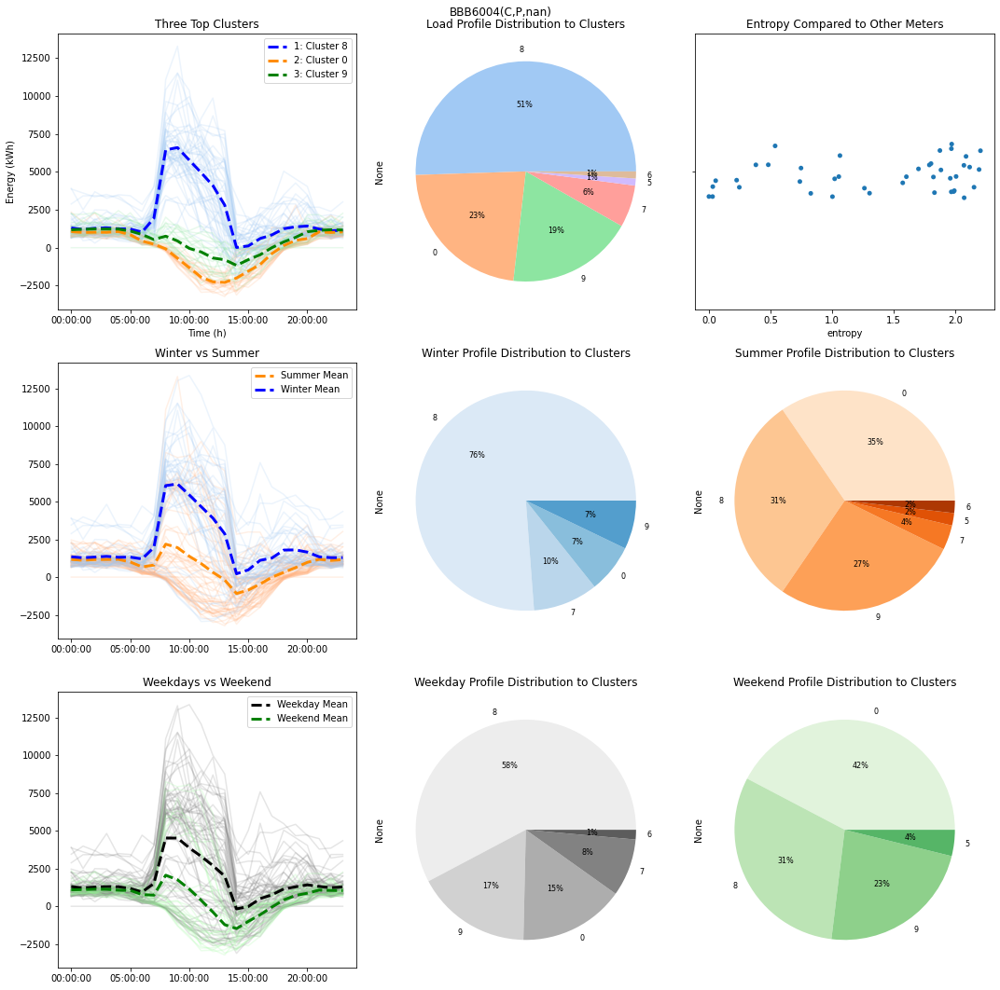

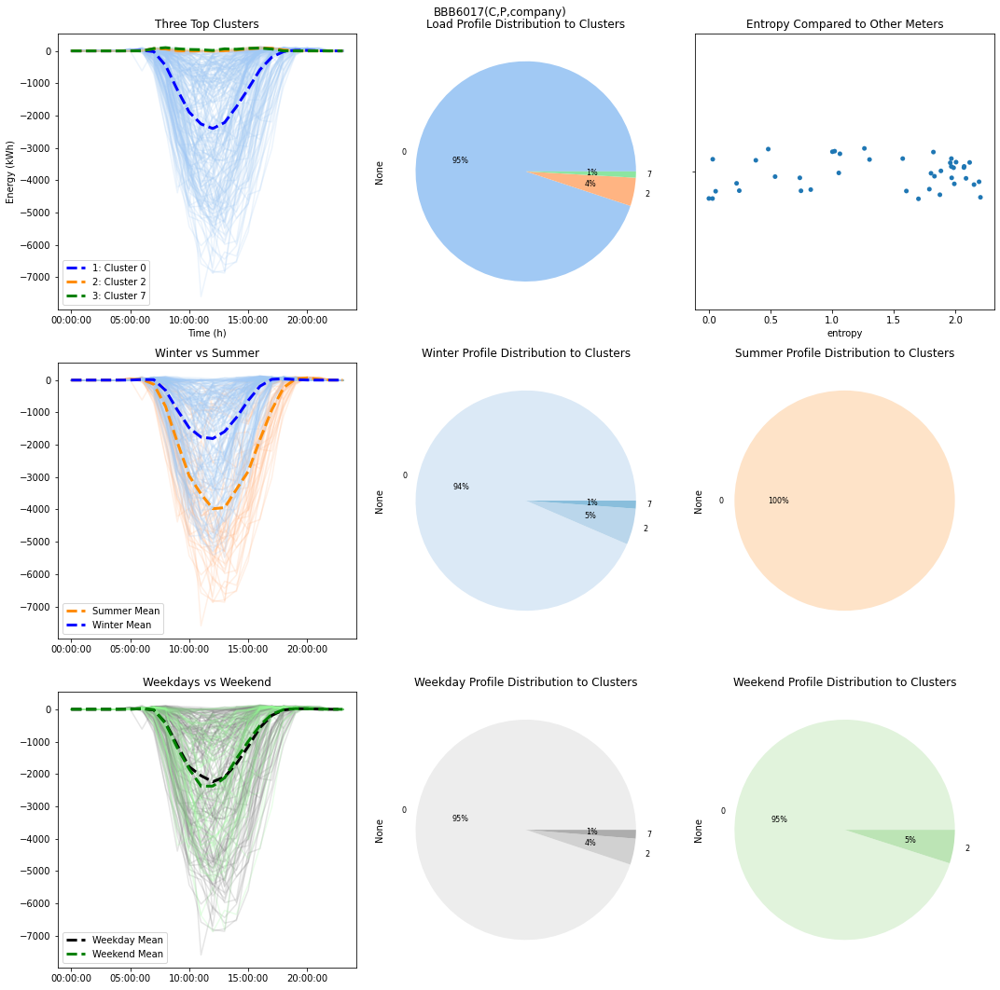

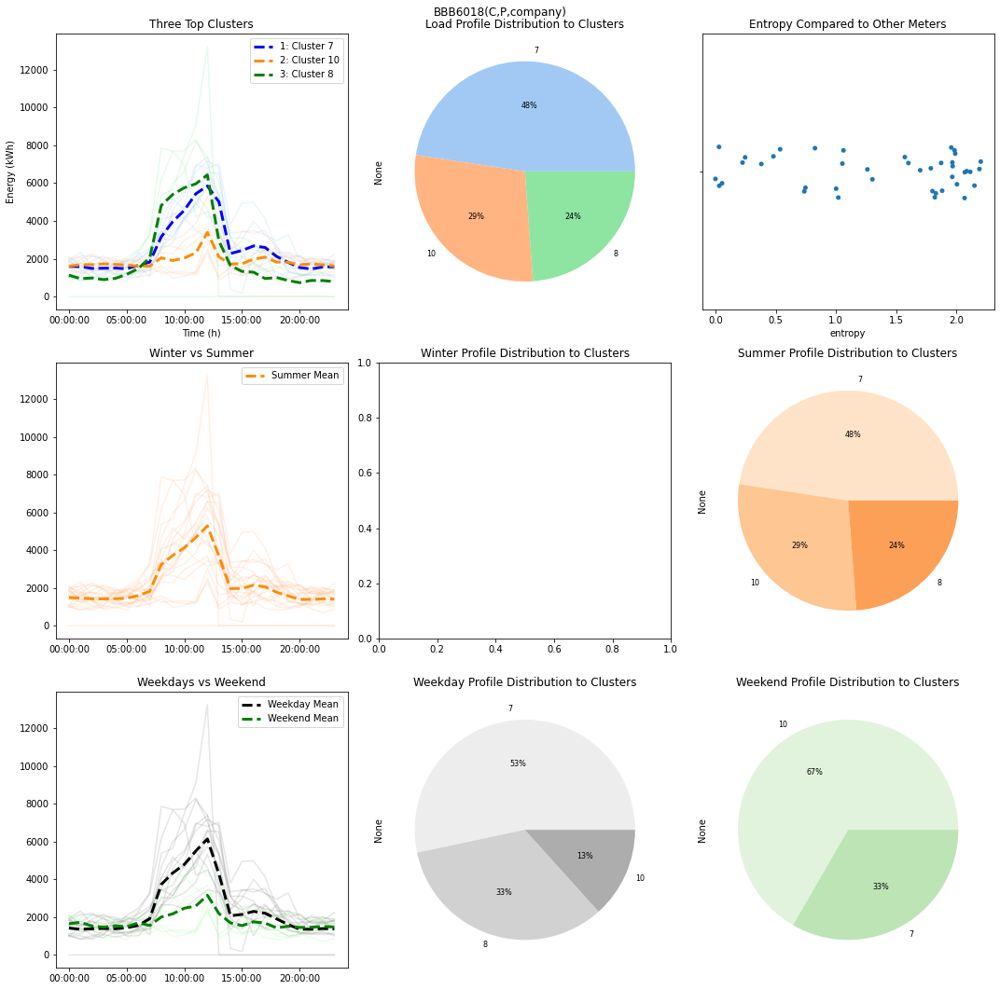

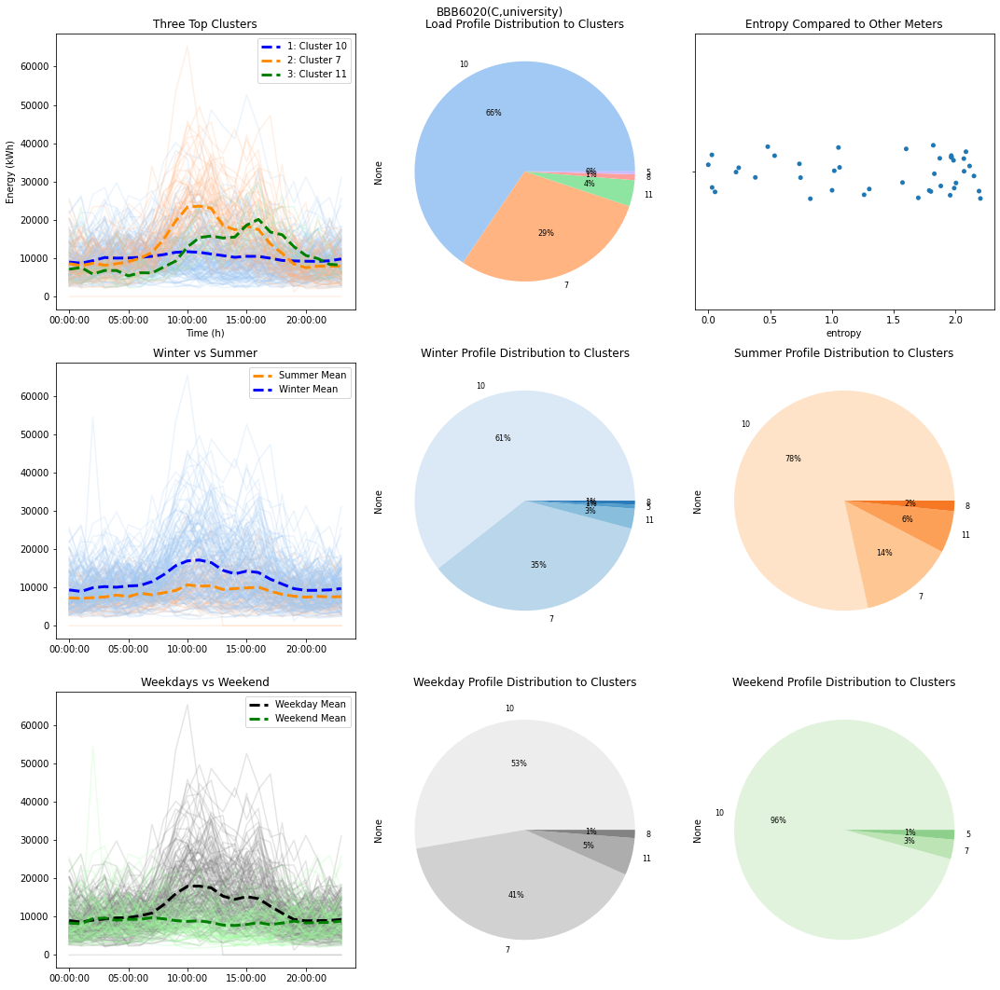

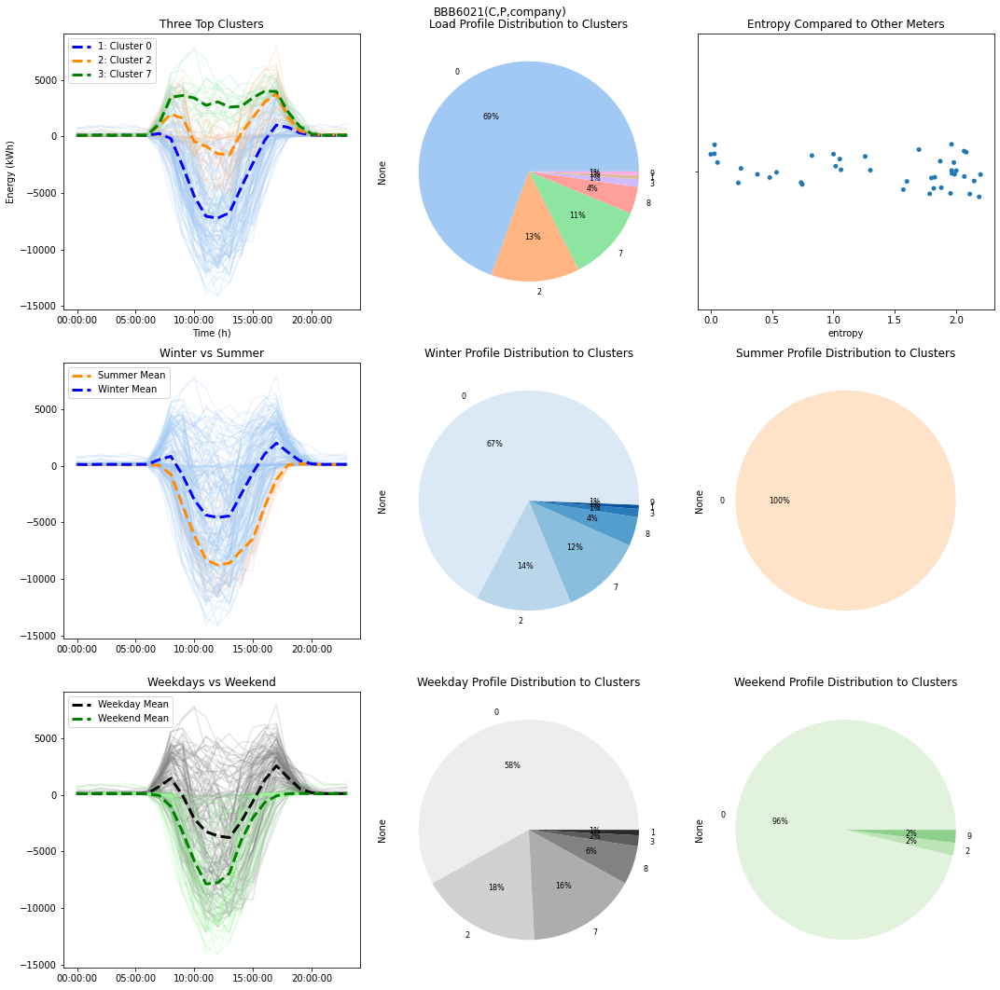

...

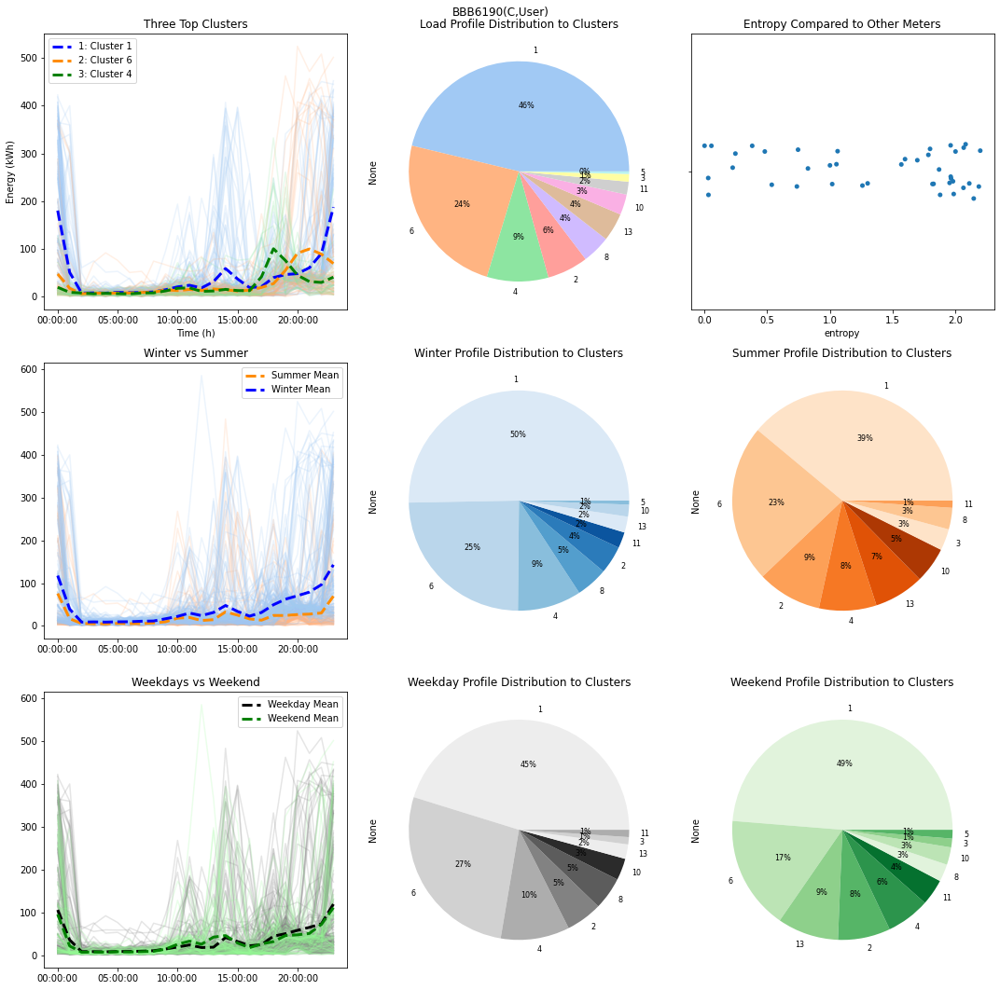

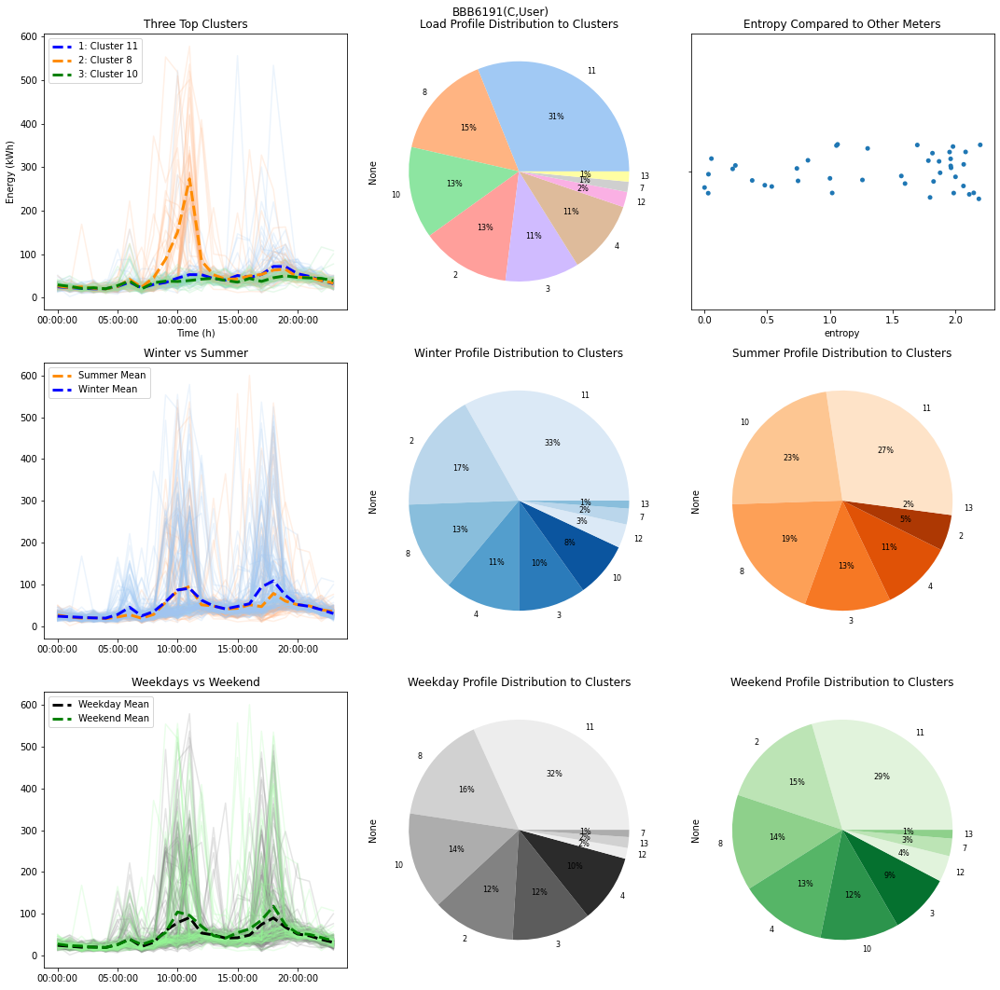

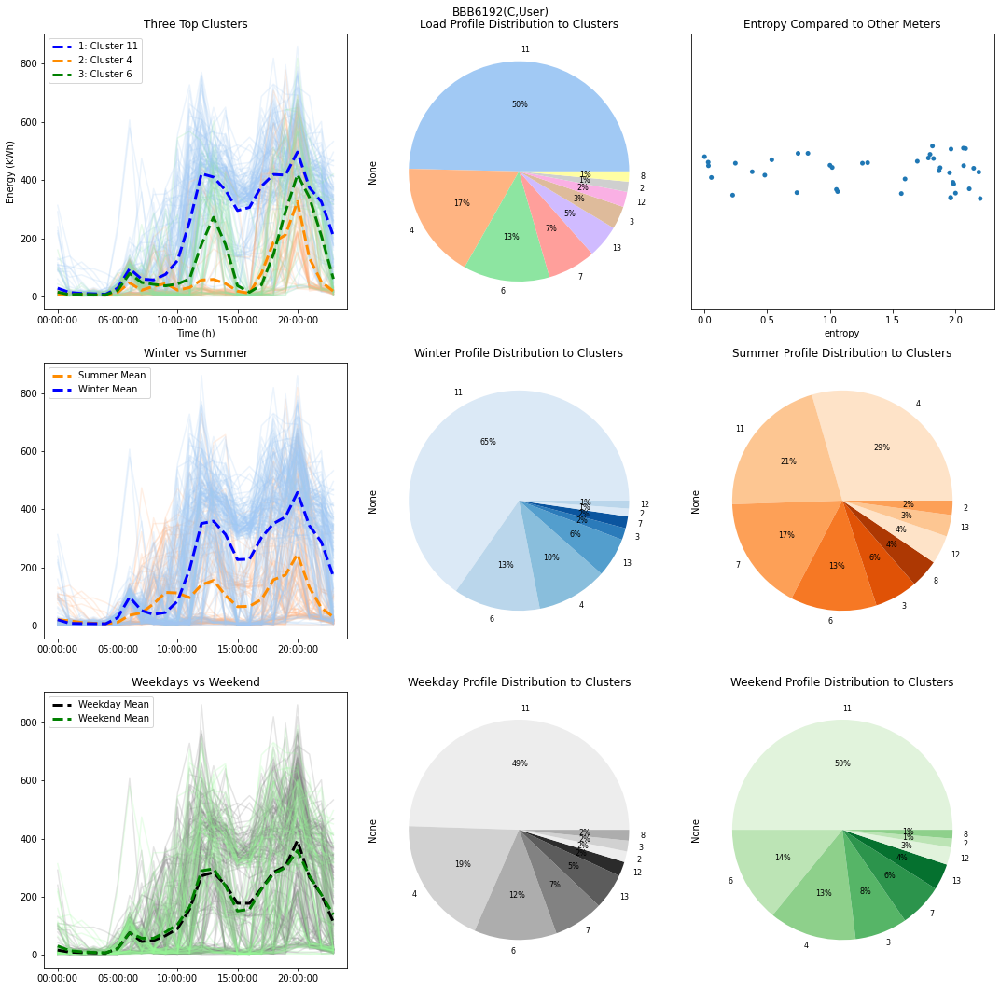

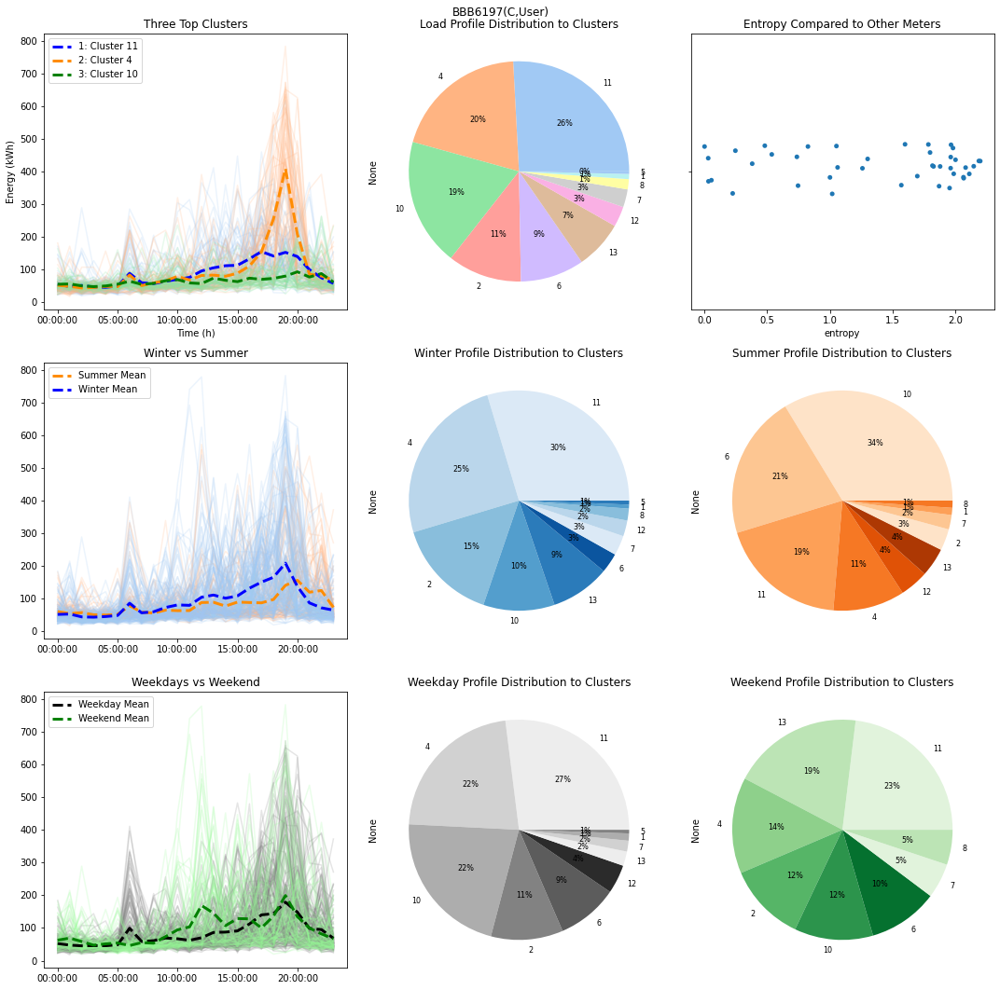

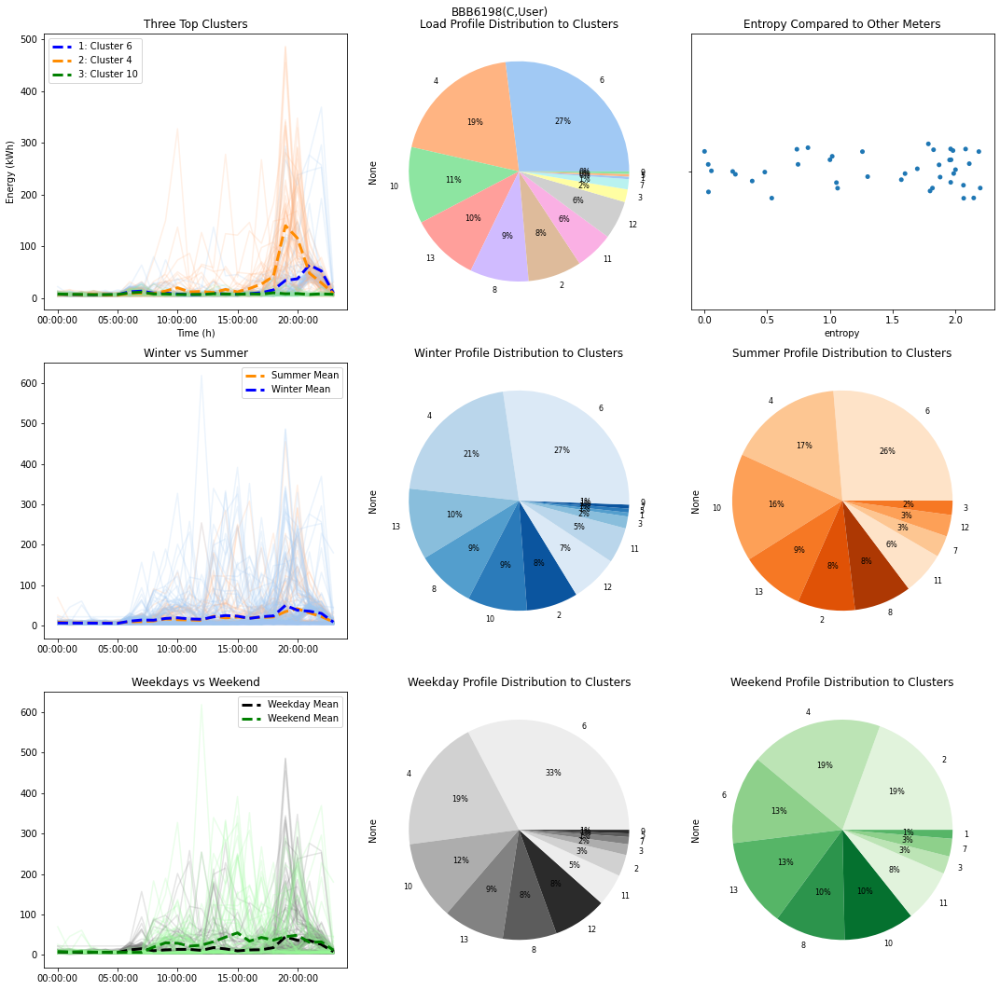

In [18]:
new_data = all_data[all_data['date']>'2021-01-01 13:15:00']
#new_data = all_data
new_data = new_data[new_data.id != 'BBB6007']
graphs_per_meter(X, new_data, 14, cluster_found, cluster_centers)

<AxesSubplot:title={'center':'Sample day for BBB6181'}>

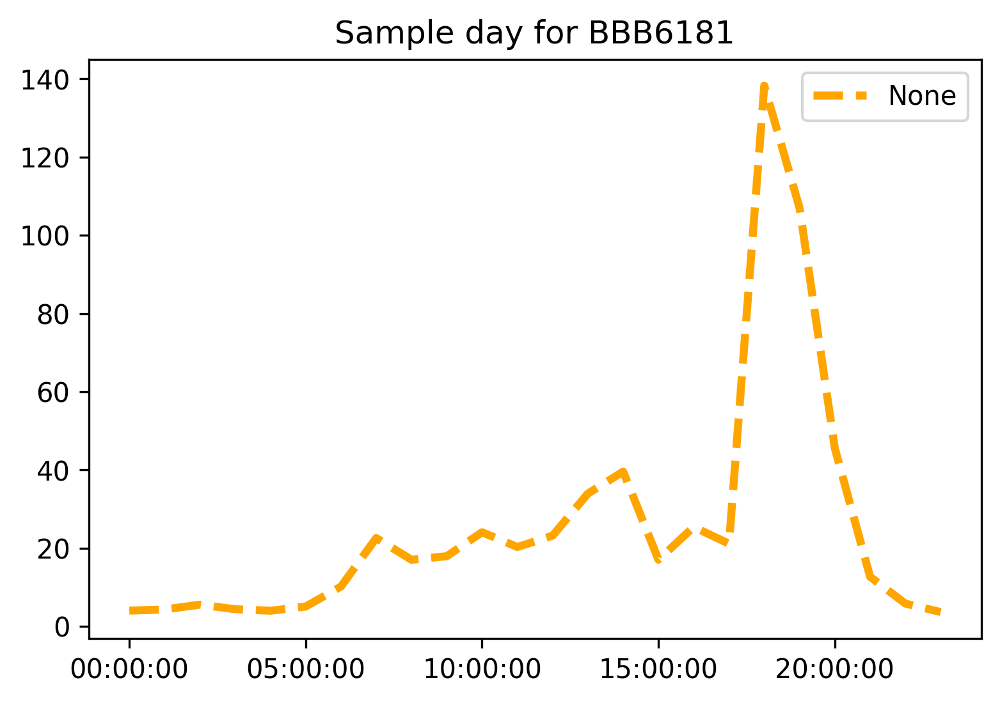

In [29]:

fig = plt.figure(dpi=300)
all_data[all_data['id']=='BBB6181'][all_data['cluster']==4].drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(legend=True, linewidth=3  ,ls='--', color='orange', title='Sample day for BBB6181', ax = plt.gca())



<AxesSubplot:title={'center':'Cluster'}>

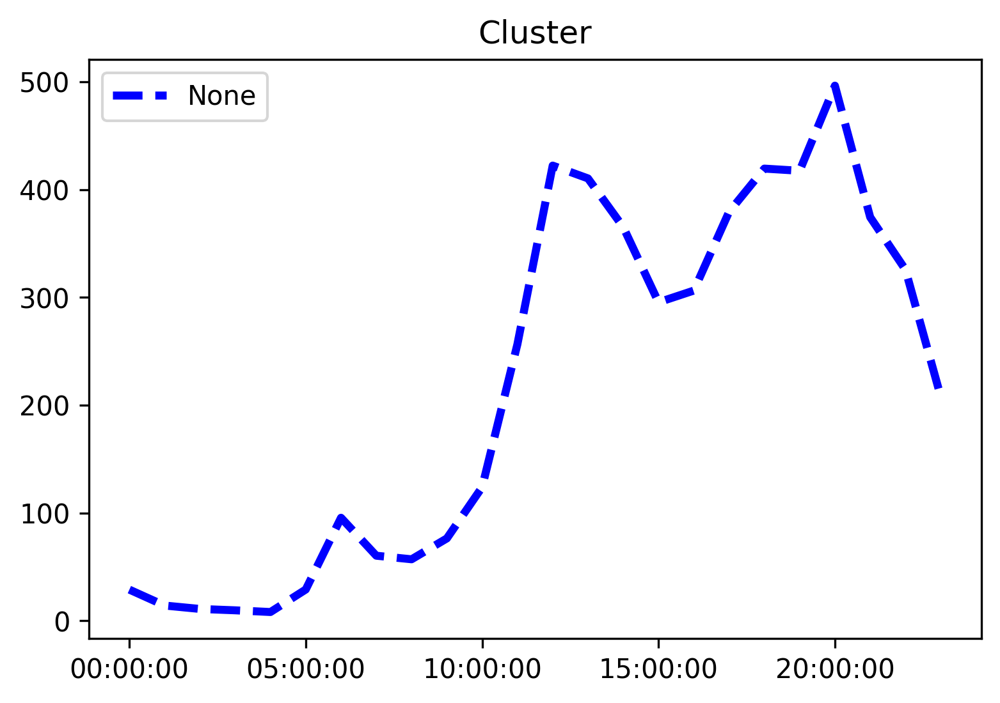

In [23]:

fig = plt.figure(dpi=300)
all_data[all_data['id']=='BBB6192'][all_data['cluster']==11].drop(columns=['cluster', 'month', 'day', 'id', 'date', 'index']).mean().plot(legend=True, linewidth=3  ,ls='--', color='blue', title='Cluster', ax = plt.gca())

